# <span style = "color:Black"> **Import & Setup**

In [1]:
import random
import os, sys
from albumentations import *
pckg_path = "C:/Users/22668/Desktop/github/sin-hoyeon/posts"
sys.path.append(pckg_path)

from creatorcamp.code.setup import *

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')
import torch
import seaborn as sns
import torchvision
from torchvision import transforms
from torchvision.transforms import *
from scipy import stats
from sklearn.datasets import make_classification
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score,recall_score
from torchvision.datasets import *
%matplotlib inline

In [3]:
all_data=get_ts_data(path=inform['path'])
print(f'Dataset의 크기 : {len(all_data)}')
print(f'Dataset에 존재하는 클래스의 갯수 : {len(all_data.classes)}')
print(f'setup \n{inform}')

Dataset의 크기 : 25503
Dataset에 존재하는 클래스의 갯수 : 20
setup 
{'name': 'hoyeon', 'path': 'C:/Users/22668/Desktop/github/sin-hoyeon/posts/creatorcamp/dataset'}


# <span style="color:black">**EDA**

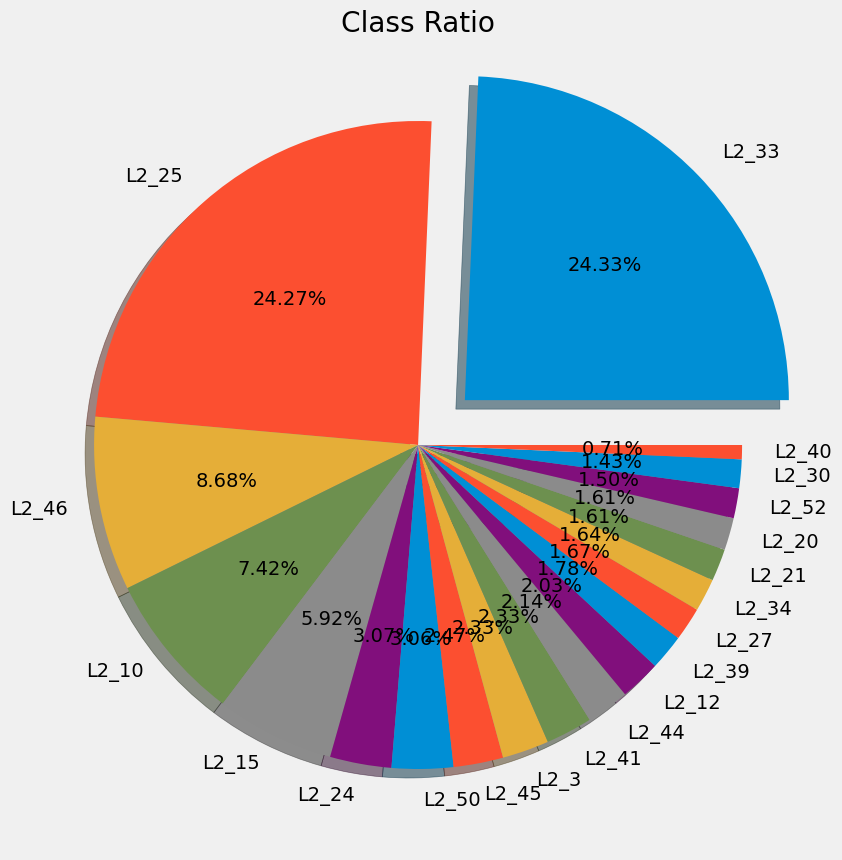

In [67]:
#1)ratio of each class
idx_to_class={}
for key,value in all_data.class_to_idx.items():
  idx_to_class[value] = key
_cls_ratio_des = [idx_to_class [idx] for idx in pd.Series(all_data.targets).value_counts().index]
_cls_ratio_des

plt.figure(figsize=(15,10))
plt.title('Class Ratio')
expld = [0]*19
expld.insert(0,0.2)
plt.pie(pd.Series(all_data.targets).value_counts(),autopct='%0.2f%%',shadow=True,labels=_cls_ratio_des,explode = expld)
plt.show()

**Insight1**

- 이미지의 갯수는 L2_33이 가장 크고 L2_40이 가장 작음
- L2_25, L2_33이 데이터 중 거의 절반을 차지하고 있고,나머지 데이터들이 매우 적은 비율을 가짐 $\to$ data set에 class imbalanced가 존재함

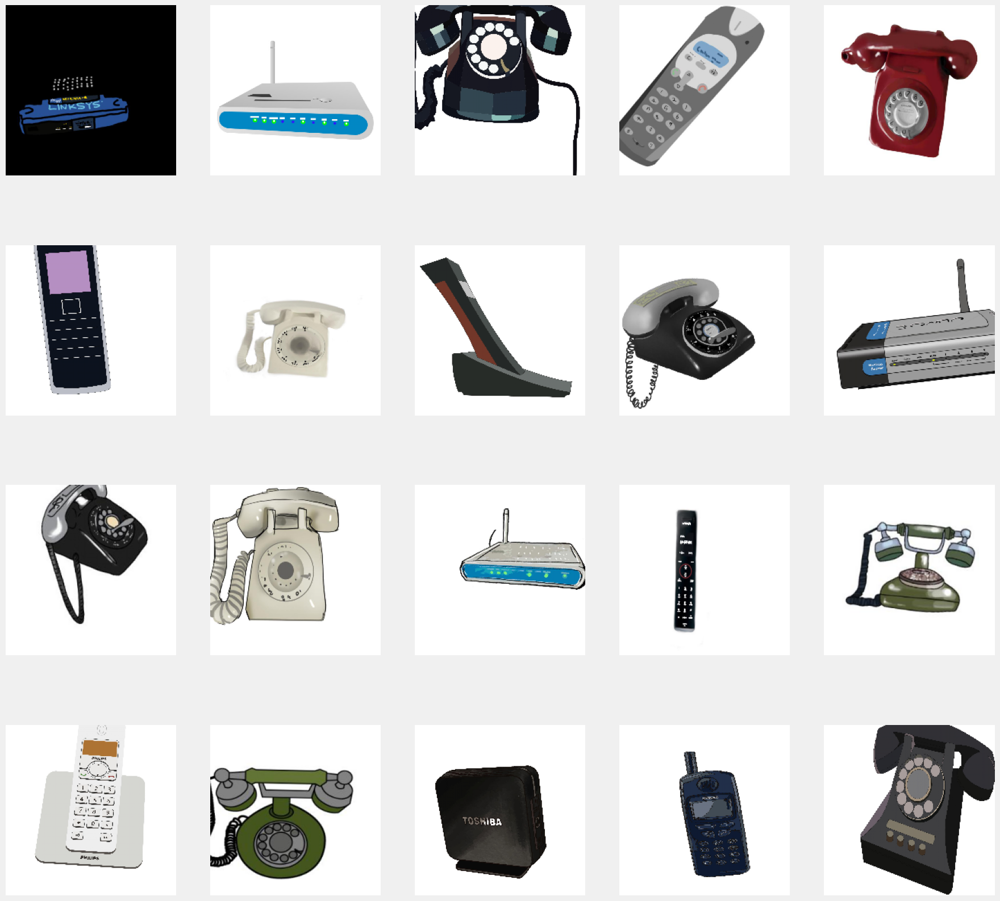

In [68]:
class_0_imgs=get_class_image(all_data,class_num=0,sampling=20)
show_images(class_0_imgs)

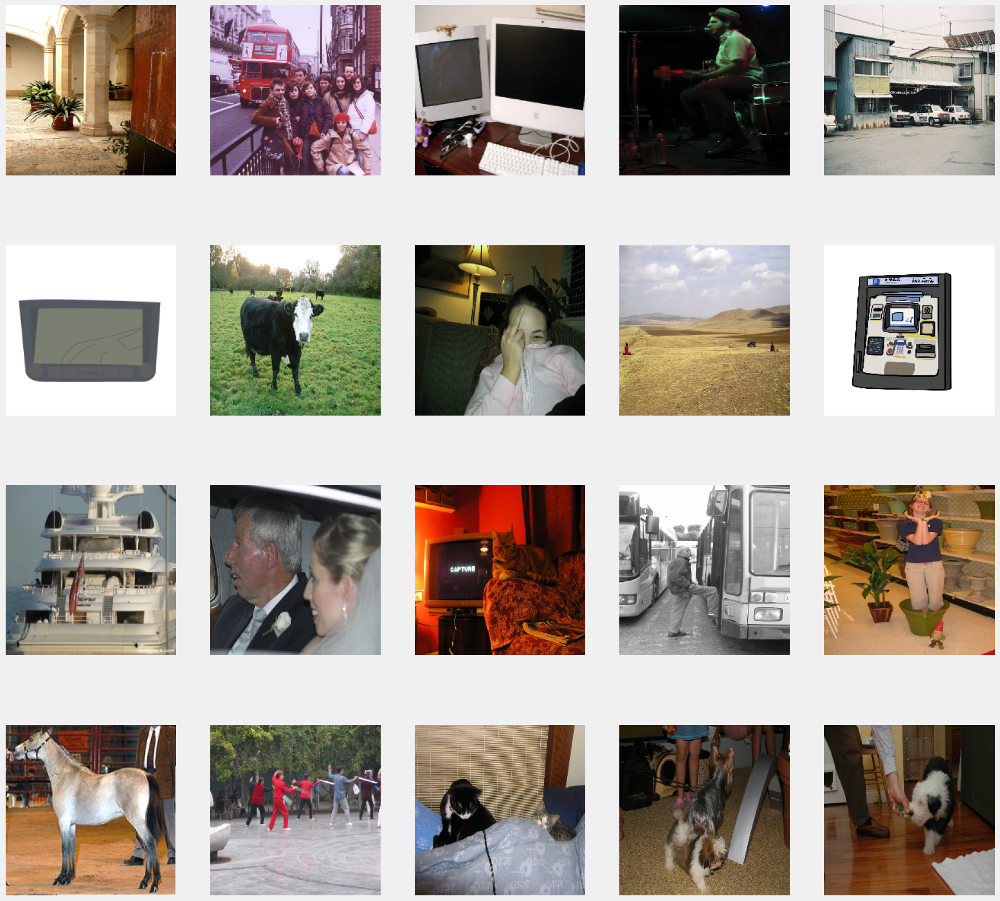

In [69]:
class_imgs=get_class_image(all_data,class_num=1,sampling=20)
show_images(class_imgs)

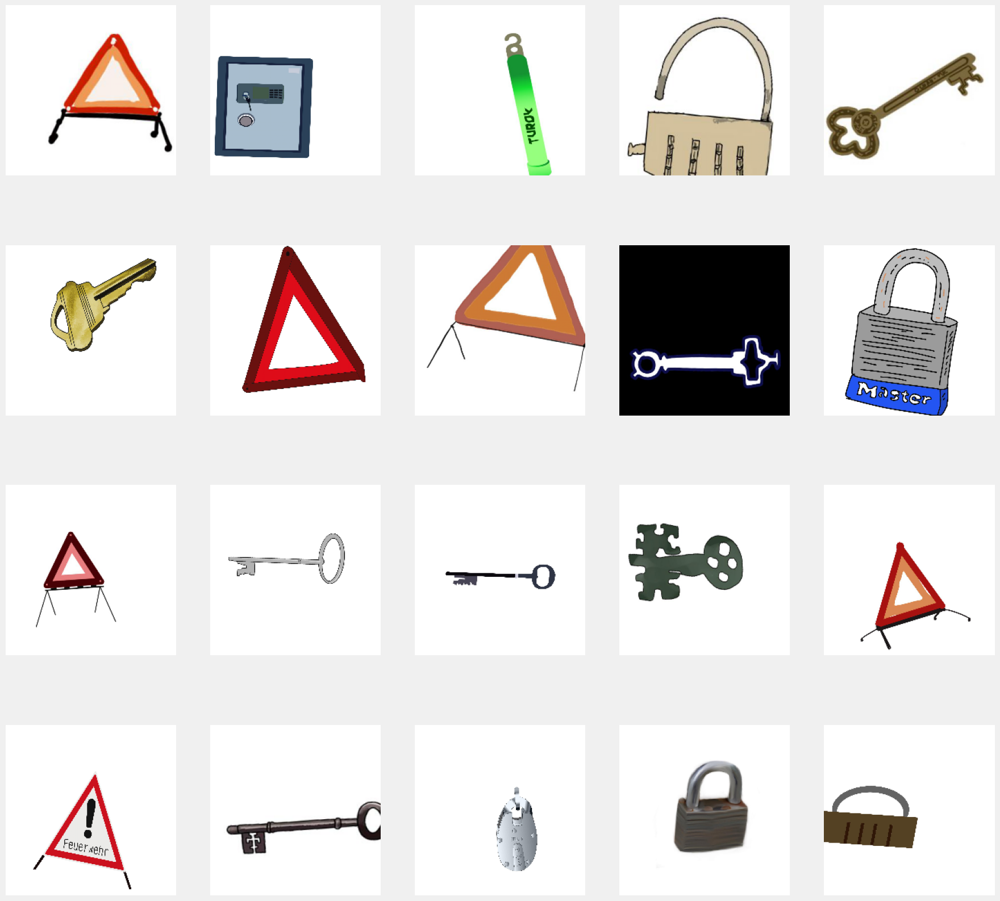

In [65]:
class_imgs=get_class_image(all_data,class_num=6,sampling=20)
show_images(class_imgs)

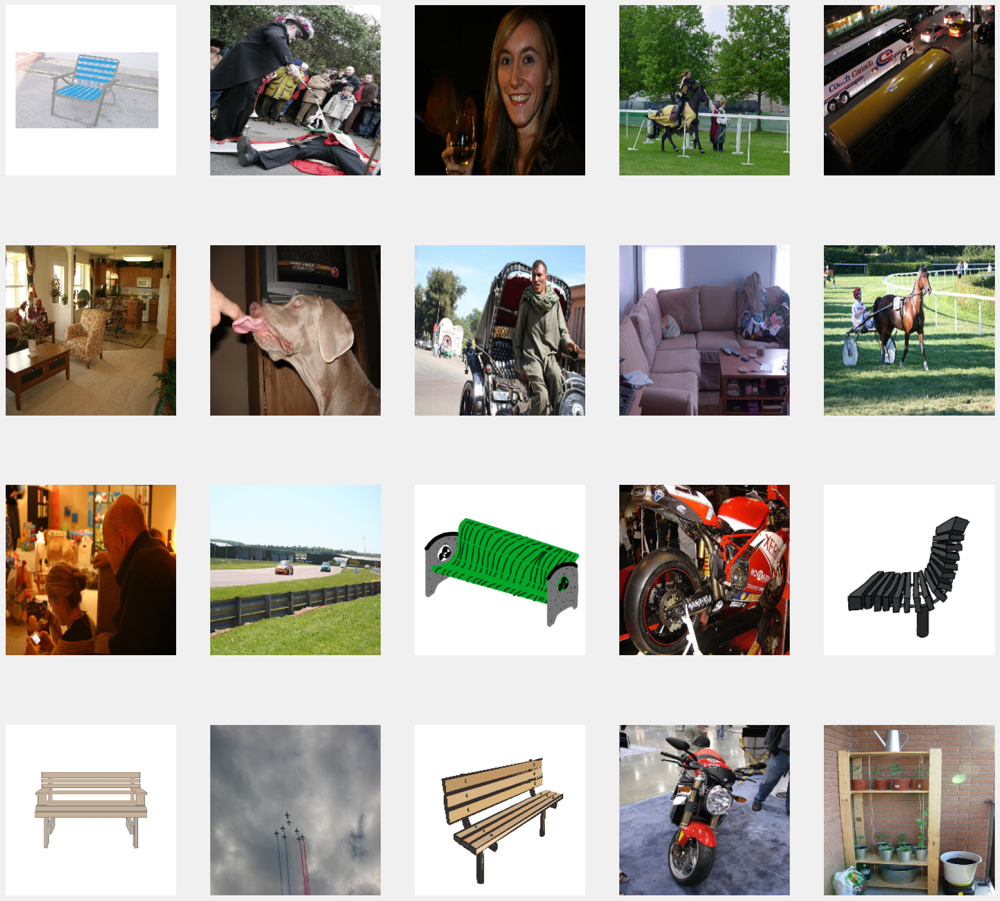

In [70]:
class_imgs=get_class_image(all_data,class_num=8,sampling=20)
show_images(class_imgs)

<span style="color:black">**Insight2**

- 우리의 목적은 픽토그램을 올바르게 분류하는 것입니다.
- 하지만 분류해야 할 대상이 아닌 실제사진이 섞여있는 클래스가 존재함을 알 수 있음.(8,1,5,14,18)
- 또한 **임의적으로 이미지를 샘플링해본 결과 그 수가 수가 적지않음.**
- 이는 학습을 방해하는 요소로 제거해줘야 할 것입니다.

In [22]:
ck_class=(all_data.class_to_idx['L2_3'],all_data.class_to_idx['L2_12'],all_data.class_to_idx['L2_24'],all_data.class_to_idx['L2_41'],all_data.class_to_idx['L2_50'])
category=pd.DataFrame({'category':all_data.targets})
category=category[(category.category == 8) | (category.category == 1) | (category.category == 5) | (category.category == 14) | (category.category == 18)]
category=category.rename(columns={'category':'class_num'})
category.class_num.value_counts()

5     782
18    781
8     595
14    593
1     518
Name: class_num, dtype: int64

In [61]:
#random.seed(10)
cls_num = [5,8,18,14,1]
_img_idx=[]
for cl_num in cls_num:
  _img_idx.append(random.sample(category[(category.class_num==cl_num)].index.values.tolist(),1)[0])
_img_idx
_tmp_imgs=get_imgs(all_data,_img_idx)

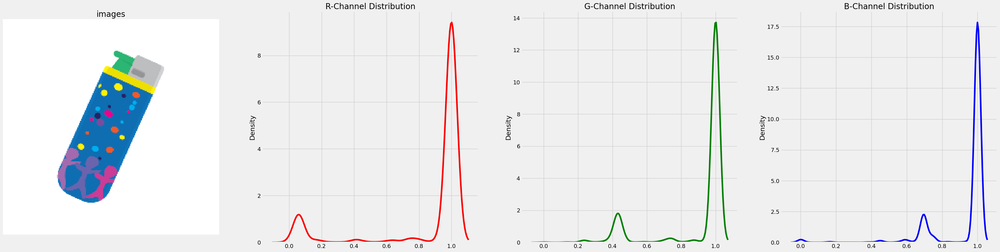

In [62]:
RGB_dist(_tmp_imgs[0])
#확률밀도함수의 y축은 0과 1사이가 아님(y축이 확률이 아니라 확률밀도이기 때문임)

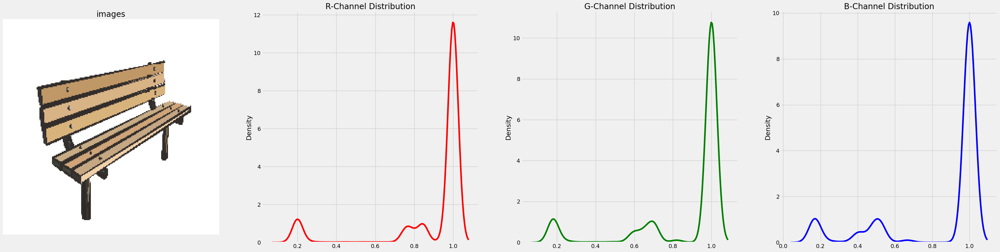

In [52]:
RGB_dist(_tmp_imgs[1])

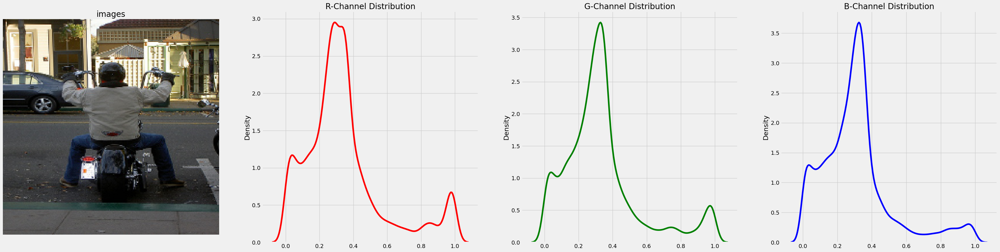

In [41]:
RGB_dist(_tmp_imgs[2])

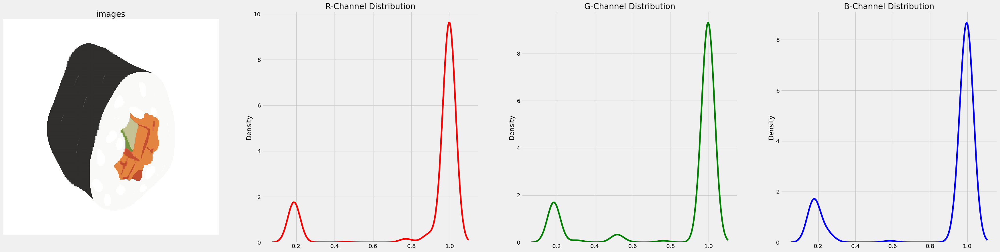

In [53]:
RGB_dist(_tmp_imgs[3])

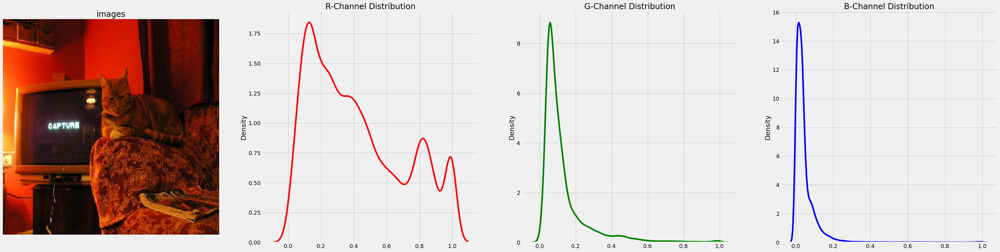

In [47]:
RGB_dist(_tmp_imgs[4])

**Insight3**

- 각 채널의 픽셀값의 분포 실제사진이던 추상미지던 정규분포를 따르지 않습니다.
- 픽토그램의 경우 모든 채널에서 1주변의 값이 나올 확률이 높습니다. 이는 픽토그램의 배경이 흰색위주라 그렇습니다.
- 실제사진의 경우 픽셀값이 골고루 퍼져 존재하기 때문에 모든 채널에서 1주변의 값이 나올 확률이 상대적으로 낮으며 픽셀값들의 분포도 조금 더 퍼져있습니다.

# <span style="color:black">**정리**

- Data set에는 20개의 클래스로 분류되어 있는 총 25503개의 이미지가 존재합니다.
- class imbalanced 문제가 존재합니다. 
- 분류해야할 픽토그램이 아닌 실제사진이 이상치로 존재합니다.
- 이는 학습에 방해하는 요소로 모형을 학습시키기 전에 미리 제거해줘야 할 것입니다.
- 픽토그램의 경우 픽셀값을 확인해본 결과 모든 채널에서 1주변으로 값이 몰려있으며 실제사진의 경우 1주변에 몰려있지 않고 값이 골고루 퍼져서 존재합니다.